In [1]:
train_path = "data/maps/train"
test_path = "data/maps/test"
dataset_path = 'data/maps/'

In [2]:
import warnings
warnings.filterwarnings('ignore')

import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
!pip install -q timm
from timm.models.layers import DropPath, to_2tuple, trunc_normal_


[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
class Config:
    IMG_SIZE = 256  # Reduced from 384
    PATCH_SIZE = 4
    IN_CHANNELS = 3
    OUT_CHANNELS = 3

    BATCH_SIZE = 1
    NUM_WORKERS = 2
    START_EPOCH = 601
    END_EPOCH = 650

    EMBED_DIM = 96
    DEPTHS = [2, 2, 6, 2]
    DEPTHS_DECODER = [2, 2, 6, 2]
    NUM_HEADS = [3, 6, 12, 24]
    WINDOW_SIZE = 8
    MLP_RATIO = 4.0

    DROP_RATE = 0.0
    ATTN_DROP_RATE = 0.0
    DROP_PATH_RATE = 0.1

    QKV_BIAS = True
    PATCH_NORM = True

    DATASET_PATH = 'data/maps/'
    CHECKPOINT_DIR = '/checkpoints/'

    LEARNING_RATE = 1e-3
    WEIGHT_DECAY = 0.0
    SAVE_EVERY = 5

    L1_WEIGHT = 1.0
    PERCEPTUAL_WEIGHT = 0.01

    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
class SatelliteMapDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        # Get a sorted list of all image file names
        try:
            self.image_files = sorted([f for f in os.listdir(root_dir) if os.path.isfile(os.path.join(root_dir, f))])
            if not self.image_files:
                print(f"Warning: No image files found in {root_dir}")
        except FileNotFoundError:
            print(f"Error: Directory not found: {root_dir}")
            print("Please make sure 'dataset_path' points to the correct location.")
            self.image_files = []

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        if idx >= len(self.image_files):
            raise IndexError("Index out of range")

        # Load the combined image
        img_path = os.path.join(self.root_dir, self.image_files[idx])
        try:
            combined_image = Image.open(img_path).convert('RGB')
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
            raise e

        combined_array = np.array(combined_image) # Shape: (600, 1200, 3)

        if combined_array.shape[0] != 600 or combined_array.shape[1] != 1200:
            print(f"Warning: Image {img_path} has unexpected shape {combined_array.shape}. Expected (600, 1200, 3). Skipping or resizing might be needed.")

        satellite_image = combined_array[:, :600, :] # Shape: (600, 600, 3)
        map_image = combined_array[:, 600:, :]       # Shape: (600, 600, 3)

        satellite_image = Image.fromarray(satellite_image)
        map_image = Image.fromarray(map_image)

        if self.transform:
            satellite_image = self.transform(satellite_image)
            map_image = self.transform(map_image)

        return satellite_image, map_image

IMG_SIZE = Config.IMG_SIZE

data_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

train_path = os.path.join(dataset_path, 'train')
val_path = os.path.join(dataset_path, 'val')

print(f"Loading training data from: {train_path}")
print(f"Loading validation data from: {val_path}")

train_dataset = SatelliteMapDataset(root_dir=train_path, transform=data_transform)
val_dataset = SatelliteMapDataset(root_dir=val_path, transform=data_transform)

BATCH_SIZE = Config.BATCH_SIZE
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print(f"\nTotal training images: {len(train_dataset)}")
print(f"Total validation images: {len(val_dataset)}")

if len(train_dataset) > 0:
    # Get one batch of data to check shapes
    sat_batch, map_batch = next(iter(train_loader))
    print(f"Satellite image batch shape: {sat_batch.shape}") # [B, C, H, W]
    print(f"Map image batch shape: {map_batch.shape}")     # [B, C, H, W]

    def show_image(tensor_img):
        tensor_img = tensor_img * 0.5 + 0.5
        plt_img = tensor_img.permute(1, 2, 0)
        plt.imshow(plt_img)
        plt.axis('off')

    sample_sat = sat_batch[0]
    sample_map = map_batch[0]

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Input Satellite Image")
    show_image(sample_sat)

    plt.subplot(1, 2, 2)
    plt.title("Target Map Image")
    show_image(sample_map)
    plt.show()
else:
    print("\nSkipping visualization as no training data was loaded.")
    print("Please ensure 'dataset_path' is correct and the '/train' directory is not empty.")

Loading training data from: data/maps/train
Loading validation data from: data/maps/val
Error: Directory not found: data/maps/val
Please make sure 'dataset_path' points to the correct location.

Total training images: 1096
Total validation images: 0


RuntimeError: DataLoader worker (pid(s) 21116, 22188) exited unexpectedly

In [ ]:
class Mlp(nn.Module):
    def __init__(self, in_features, hidden_features=None, out_features=None, act_layer=nn.GELU, drop=0.):
        super().__init__()
        out_features = out_features or in_features
        hidden_features = hidden_features or in_features
        self.fc1 = nn.Linear(in_features, hidden_features)
        self.act = act_layer()
        self.fc2 = nn.Linear(hidden_features, out_features)
        self.drop = nn.Dropout(drop)

    def forward(self, x):
        x = self.fc1(x)
        x = self.act(x)
        x = self.drop(x)
        x = self.fc2(x)
        x = self.drop(x)
        return x

def window_partition(x, window_size):
    B, H, W, C = x.shape
    x = x.view(B, H // window_size, window_size, W // window_size, window_size, C)
    windows = x.permute(0, 1, 3, 2, 4, 5).contiguous().view(-1, window_size, window_size, C)
    return windows

def window_reverse(windows, window_size, H, W):
    B = int(windows.shape[0] / (H * W / window_size / window_size))
    x = windows.view(B, H // window_size, W // window_size, window_size, window_size, -1)
    x = x.permute(0, 1, 3, 2, 4, 5).contiguous().view(B, H, W, -1)
    return x

class SwinTransformerBlock(nn.Module):
    def __init__(self, dim, input_resolution, num_heads, window_size=7, shift_size=0,
                 mlp_ratio=4., qkv_bias=True, drop=0., attn_drop=0., drop_path=0.,
                 act_layer=nn.GELU, norm_layer=nn.LayerNorm):
        super().__init__()
        self.dim = dim
        self.input_resolution = input_resolution
        self.num_heads = num_heads
        self.window_size = window_size
        self.shift_size = shift_size
        self.mlp_ratio = mlp_ratio

        if min(self.input_resolution) <= self.window_size:
            self.shift_size = 0
            self.window_size = min(self.input_resolution)

        self.norm1 = norm_layer(dim)
        self.relative_position_bias_table = nn.Parameter(
            torch.zeros((2 * window_size - 1) * (2 * window_size - 1), num_heads))

        coords_h = torch.arange(self.window_size)
        coords_w = torch.arange(self.window_size)
        coords = torch.stack(torch.meshgrid([coords_h, coords_w], indexing='ij'))
        coords_flatten = torch.flatten(coords, 1)
        relative_coords = coords_flatten[:, :, None] - coords_flatten[:, None, :]
        relative_coords = relative_coords.permute(1, 2, 0).contiguous()
        relative_coords[:, :, 0] += self.window_size - 1
        relative_coords[:, :, 1] += self.window_size - 1
        relative_coords[:, :, 0] *= 2 * self.window_size - 1
        relative_position_index = relative_coords.sum(-1)
        self.register_buffer("relative_position_index", relative_position_index)

        self.qkv = nn.Linear(dim, dim * 3, bias=qkv_bias)
        self.attn_drop = nn.Dropout(attn_drop)
        self.proj = nn.Linear(dim, dim)
        self.proj_drop = nn.Dropout(drop)
        trunc_normal_(self.relative_position_bias_table, std=.02)
        self.softmax = nn.Softmax(dim=-1)

        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()
        self.norm2 = norm_layer(dim)
        mlp_hidden_dim = int(dim * mlp_ratio)
        self.mlp = Mlp(in_features=dim, hidden_features=mlp_hidden_dim, act_layer=act_layer, drop=drop)

        if self.shift_size > 0:
            H, W = self.input_resolution
            img_mask = torch.zeros((1, H, W, 1))
            h_slices = (slice(0, -self.window_size),
                        slice(-self.window_size, -self.shift_size),
                        slice(-self.shift_size, None))
            w_slices = (slice(0, -self.window_size),
                        slice(-self.window_size, -self.shift_size),
                        slice(-self.shift_size, None))
            cnt = 0
            for h in h_slices:
                for w in w_slices:
                    img_mask[:, h, w, :] = cnt
                    cnt += 1
            mask_windows = window_partition(img_mask, self.window_size)
            mask_windows = mask_windows.view(-1, self.window_size * self.window_size)
            attn_mask = mask_windows.unsqueeze(1) - mask_windows.unsqueeze(2)
            attn_mask = attn_mask.masked_fill(attn_mask != 0, float(-100.0)).masked_fill(attn_mask == 0, float(0.0))
        else:
            attn_mask = None
        self.register_buffer("attn_mask", attn_mask)

    def forward_attn(self, x):
        B_, N, C = x.shape
        qkv = self.qkv(x).reshape(B_, N, 3, self.num_heads, C // self.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]
        q = q * (self.dim // self.num_heads) ** -0.5
        attn = (q @ k.transpose(-2, -1))
        relative_position_bias = self.relative_position_bias_table[self.relative_position_index.view(-1)].view(
            self.window_size * self.window_size, self.window_size * self.window_size, -1)
        relative_position_bias = relative_position_bias.permute(2, 0, 1).contiguous()
        attn = attn + relative_position_bias.unsqueeze(0)

        if self.attn_mask is not None:
            nW = self.attn_mask.shape[0]
            attn = attn.view(B_ // nW, nW, self.num_heads, N, N) + self.attn_mask.unsqueeze(1).unsqueeze(0)
            attn = attn.view(-1, self.num_heads, N, N)
        attn = self.softmax(attn)
        attn = self.attn_drop(attn)
        x = (attn @ v).transpose(1, 2).reshape(B_, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)
        return x

    def forward(self, x):
        H, W = self.input_resolution
        B, L, C = x.shape
        assert L == H * W, f"input size {L} doesn't match {H}*{W}"

        shortcut = x
        x = self.norm1(x)
        x = x.view(B, H, W, C)

        if self.shift_size > 0:
            shifted_x = torch.roll(x, shifts=(-self.shift_size, -self.shift_size), dims=(1, 2))
        else:
            shifted_x = x

        x_windows = window_partition(shifted_x, self.window_size)
        x_windows = x_windows.view(-1, self.window_size * self.window_size, C)
        attn_windows = self.forward_attn(x_windows)
        attn_windows = attn_windows.view(-1, self.window_size, self.window_size, C)
        shifted_x = window_reverse(attn_windows, self.window_size, H, W)

        if self.shift_size > 0:
            x = torch.roll(shifted_x, shifts=(self.shift_size, self.shift_size), dims=(1, 2))
        else:
            x = shifted_x
        x = x.view(B, H * W, C)
        x = shortcut + self.drop_path(x)
        x = x + self.drop_path(self.mlp(self.norm2(x)))
        return x

class PatchEmbed(nn.Module):
    def __init__(self, img_size=224, patch_size=4, in_chans=3, embed_dim=96, norm_layer=None):
        super().__init__()
        img_size = to_2tuple(img_size)
        patch_size = to_2tuple(patch_size)
        self.img_size = img_size
        self.patch_size = patch_size
        self.patches_resolution = [img_size[0] // patch_size[0], img_size[1] // patch_size[1]]
        self.num_patches = self.patches_resolution[0] * self.patches_resolution[1]
        self.in_chans = in_chans
        self.embed_dim = embed_dim

        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)
        self.norm = norm_layer(embed_dim) if norm_layer else None

    def forward(self, x):
        x = self.proj(x).flatten(2).transpose(1, 2)
        if self.norm:
            x = self.norm(x)
        return x

class PatchMerging(nn.Module):
    def __init__(self, input_resolution, dim, norm_layer=nn.LayerNorm):
        super().__init__()
        self.input_resolution = input_resolution
        self.dim = dim
        self.reduction = nn.Linear(4 * dim, 2 * dim, bias=False)
        self.norm = norm_layer(4 * dim)

    def forward(self, x):
        H, W = self.input_resolution
        B, L, C = x.shape
        x = x.view(B, H, W, C)
        x0 = x[:, 0::2, 0::2, :]
        x1 = x[:, 1::2, 0::2, :]
        x2 = x[:, 0::2, 1::2, :]
        x3 = x[:, 1::2, 1::2, :]
        x = torch.cat([x0, x1, x2, x3], -1)
        x = x.view(B, -1, 4 * C)
        x = self.norm(x)
        x = self.reduction(x)
        return x

class BasicLayer(nn.Module):
    def __init__(self, dim, input_resolution, depth, num_heads, window_size,
                 mlp_ratio=4., qkv_bias=True, drop=0., attn_drop=0.,
                 drop_path=0., norm_layer=nn.LayerNorm, downsample=None):
        super().__init__()
        self.blocks = nn.ModuleList([
            SwinTransformerBlock(
                dim=dim, input_resolution=input_resolution, num_heads=num_heads,
                window_size=window_size, shift_size=0 if (i % 2 == 0) else window_size // 2,
                mlp_ratio=mlp_ratio, qkv_bias=qkv_bias, drop=drop, attn_drop=attn_drop,
                drop_path=drop_path[i] if isinstance(drop_path, list) else drop_path,
                norm_layer=norm_layer)
            for i in range(depth)])
        self.downsample = downsample(input_resolution, dim=dim, norm_layer=norm_layer) if downsample else None

    def forward(self, x):
        for blk in self.blocks:
            x = blk(x)
        if self.downsample:
            x = self.downsample(x)
        return x

class PatchExpand(nn.Module):
    def __init__(self, input_resolution, dim, norm_layer=nn.LayerNorm):
        super().__init__()
        self.input_resolution = input_resolution
        self.dim = dim
        self.expand = nn.Linear(dim, 2 * dim, bias=False)
        self.norm = norm_layer(dim // 2)

    def forward(self, x):
        H, W = self.input_resolution
        x = self.expand(x)
        B, L, C = x.shape
        x = x.view(B, H, W, 2, 2, C // 4)
        x = x.permute(0, 1, 3, 2, 4, 5).contiguous().view(B, H * 2, W * 2, C // 4)
        x = x.view(B, -1, C // 4)
        x = self.norm(x)
        return x

class BasicLayer_up(nn.Module):
    def __init__(self, dim, input_resolution, depth, num_heads, window_size,
                 mlp_ratio=4., qkv_bias=True, drop=0., attn_drop=0.,
                 drop_path=0., norm_layer=nn.LayerNorm, upsample=None):
        super().__init__()
        self.blocks = nn.ModuleList([
            SwinTransformerBlock(
                dim=dim, input_resolution=input_resolution, num_heads=num_heads,
                window_size=window_size, shift_size=0 if (i % 2 == 0) else window_size // 2,
                mlp_ratio=mlp_ratio, qkv_bias=qkv_bias, drop=drop, attn_drop=attn_drop,
                drop_path=drop_path[i] if isinstance(drop_path, list) else drop_path,
                norm_layer=norm_layer)
            for i in range(depth)])
        self.upsample = upsample

    def forward(self, x):
        for blk in self.blocks:
            x = blk(x)
        if self.upsample:
            x = self.upsample(x)
        return x

class SwinUNetpp(nn.Module):
    def __init__(self, config):
        super().__init__()

        # Extract config values
        img_size = config.IMG_SIZE
        patch_size = config.PATCH_SIZE
        in_chans = config.IN_CHANNELS
        num_classes = config.OUT_CHANNELS
        embed_dim = config.EMBED_DIM
        depths = config.DEPTHS
        depths_decoder = config.DEPTHS_DECODER
        num_heads = config.NUM_HEADS
        window_size = config.WINDOW_SIZE
        mlp_ratio = config.MLP_RATIO
        qkv_bias = config.QKV_BIAS
        drop_rate = config.DROP_RATE
        attn_drop_rate = config.ATTN_DROP_RATE
        drop_path_rate = config.DROP_PATH_RATE
        norm_layer = nn.LayerNorm
        patch_norm = config.PATCH_NORM

        self.num_classes = num_classes
        self.num_layers = len(depths)
        self.embed_dim = embed_dim
        self.num_features = int(embed_dim * 2 ** (self.num_layers - 1))
        self.patches_resolution = [img_size // patch_size, img_size // patch_size]

        # Patch embedding
        self.patch_embed = PatchEmbed(
            img_size=img_size, patch_size=patch_size, in_chans=in_chans,
            embed_dim=embed_dim, norm_layer=norm_layer if patch_norm else None)
        self.pos_drop = nn.Dropout(p=drop_rate)

        # Stochastic depth
        dpr = [x.item() for x in torch.linspace(0, drop_path_rate, sum(depths))]
        dpr_decoder = [x.item() for x in torch.linspace(0, drop_path_rate, sum(depths_decoder))]

        # Encoder layers
        self.layers = nn.ModuleList()
        for i in range(self.num_layers):
            layer = BasicLayer(
                dim=int(embed_dim * 2 ** i),
                input_resolution=(self.patches_resolution[0] // (2 ** i),
                                 self.patches_resolution[1] // (2 ** i)),
                depth=depths[i], num_heads=num_heads[i], window_size=window_size,
                mlp_ratio=mlp_ratio, qkv_bias=qkv_bias, drop=drop_rate,
                attn_drop=attn_drop_rate,
                drop_path=dpr[sum(depths[:i]):sum(depths[:i + 1])],
                norm_layer=norm_layer,
                downsample=PatchMerging if (i < self.num_layers - 1) else None)
            self.layers.append(layer)

        # Decoder layers
        self.layers_up = nn.ModuleList()
        self.concat_back_dim = nn.ModuleList()

        for i in range(self.num_layers - 1):
            concat_linear = nn.Linear(
                2 * int(embed_dim * 2 ** (self.num_layers - 1 - i)),
                int(embed_dim * 2 ** (self.num_layers - 1 - i)))
            self.concat_back_dim.append(concat_linear)

            layer_up = BasicLayer_up(
                dim=int(embed_dim * 2 ** (self.num_layers - 1 - i)),
                input_resolution=(self.patches_resolution[0] // (2 ** (self.num_layers - 1 - i)),
                                 self.patches_resolution[1] // (2 ** (self.num_layers - 1 - i))),
                depth=depths_decoder[self.num_layers - 1 - i],
                num_heads=num_heads[self.num_layers - 1 - i],
                window_size=window_size, mlp_ratio=mlp_ratio, qkv_bias=qkv_bias,
                drop=drop_rate, attn_drop=attn_drop_rate,
                drop_path=dpr_decoder[sum(depths_decoder[:self.num_layers - 1 - i]):sum(depths_decoder[:self.num_layers - i])],
                norm_layer=norm_layer,
                upsample=PatchExpand(
                    input_resolution=(self.patches_resolution[0] // (2 ** (self.num_layers - 1 - i)),
                                     self.patches_resolution[1] // (2 ** (self.num_layers - 1 - i))),
                    dim=int(embed_dim * 2 ** (self.num_layers - 1 - i)),
                    norm_layer=norm_layer) if (i < self.num_layers - 1) else None)
            self.layers_up.append(layer_up)

        self.norm_up = norm_layer(embed_dim)

        # Final upsampling to original image size
        scale_factor = patch_size
        self.up_final = nn.Upsample(scale_factor=scale_factor, mode='bilinear', align_corners=False)
        self.conv_final = nn.Sequential(
            nn.Conv2d(embed_dim, embed_dim // 2, kernel_size=3, padding=1),
            nn.BatchNorm2d(embed_dim // 2),
            nn.ReLU(inplace=True),
            nn.Conv2d(embed_dim // 2, num_classes, kernel_size=1)
        )

        self.final_activation = nn.Tanh()
        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.LayerNorm):
            nn.init.constant_(m.bias, 0)
            nn.init.constant_(m.weight, 1.0)

    def forward(self, x):
        x = self.patch_embed(x)
        x = self.pos_drop(x)

        # Encoder: store skip connections BEFORE downsampling
        x_downsample = []
        for layer in self.layers:
            for blk in layer.blocks:
                x = blk(x)
            x_downsample.append(x)
            if layer.downsample:
                x = layer.downsample(x)

        # Decoder
        for i, layer_up in enumerate(self.layers_up):
            if i == 0:
                x = layer_up(x)
            else:
                x = torch.cat([x, x_downsample[self.num_layers - 1 - i]], -1)
                x = self.concat_back_dim[i](x)
                x = layer_up(x)

        x = self.norm_up(x)

        # Reshape to image [B, H, W, C] -> [B, C, H, W]
        B, L, C = x.shape
        H = W = int(L ** 0.5)
        x = x.view(B, H, W, C).permute(0, 3, 1, 2).contiguous()

        # Upsample and get final output
        x = self.up_final(x)
        x = self.conv_final(x)
        x = self.final_activation(x)

        return [x]

print("="*60)
print("SWIN-UNET++ CONFIGURATION")
print("="*60)
print(f"Image Size: {Config.IMG_SIZE}x{Config.IMG_SIZE}")
print(f"Batch Size: {Config.BATCH_SIZE}")
print(f"Embed Dim: {Config.EMBED_DIM}")
print(f"Window Size: {Config.WINDOW_SIZE}")
print(f"Depths: {Config.DEPTHS}")
print(f"Num Heads: {Config.NUM_HEADS}")
print(f"Device: {Config.DEVICE}")
print("="*60)

# Create model
model = SwinUNetpp(Config).to(Config.DEVICE)

# Create dummy input
dummy_input = torch.randn(
    Config.BATCH_SIZE,
    Config.IN_CHANNELS,
    Config.IMG_SIZE,
    Config.IMG_SIZE
).to(Config.DEVICE)

print(f"\nRunning forward pass with input shape: {dummy_input.shape}")
outputs = model(dummy_input)

print(f"Model created successfully!")
print(f"Output shape: {outputs[0].shape}")
print(f"Model has {sum(p.numel() for p in model.parameters()):,} parameters")
print("="*60)

SWIN-UNET++ CONFIGURATION
Image Size: 256x256
Batch Size: 1
Embed Dim: 96
Window Size: 8
Depths: [2, 2, 6, 2]
Num Heads: [3, 6, 12, 24]
Device: cuda

Running forward pass with input shape: torch.Size([1, 3, 256, 256])
Model created successfully!
Output shape: torch.Size([1, 3, 256, 256])
Model has 56,408,721 parameters


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
import torchvision.models as models
import re

class VGGPerceptualLoss(nn.Module):
    def __init__(self):
        super().__init__()
        # Load pretrained VGG19
        vgg = models.vgg19(pretrained=True).features

        self.slice1 = nn.Sequential(*list(vgg.children())[:4])
        self.slice2 = nn.Sequential(*list(vgg.children())[4:9])
        self.slice3 = nn.Sequential(*list(vgg.children())[9:18])
        self.slice4 = nn.Sequential(*list(vgg.children())[18:27])

        # Freeze all parameters
        for param in self.parameters():
            param.requires_grad = False

        self.eval()

    def forward(self, x, y):
        x = (x + 1) / 2
        y = (y + 1) / 2

        mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(x.device)
        std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(x.device)
        x = (x - mean) / std
        y = (y - mean) / std

        loss = 0.0

        x1 = self.slice1(x)
        y1 = self.slice1(y)
        loss += nn.functional.l1_loss(x1, y1)

        x2 = self.slice2(x1)
        y2 = self.slice2(y1)
        loss += nn.functional.l1_loss(x2, y2)

        x3 = self.slice3(x2)
        y3 = self.slice3(y2)
        loss += nn.functional.l1_loss(x3, y3)

        x4 = self.slice4(x3)
        y4 = self.slice4(y3)
        loss += nn.functional.l1_loss(x4, y4)

        return loss / 4.0

def save_checkpoint(model, optimizer, scaler, epoch, loss, config, filename):
    """Save model checkpoint"""
    os.makedirs(config.CHECKPOINT_DIR, exist_ok=True)
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scaler_state_dict': scaler.state_dict(),
        'loss': loss,
        'config': {
            'IMG_SIZE': config.IMG_SIZE,
            'EMBED_DIM': config.EMBED_DIM,
            'DEPTHS': config.DEPTHS,
            'NUM_HEADS': config.NUM_HEADS,
            'WINDOW_SIZE': config.WINDOW_SIZE,
        }
    }
    filepath = os.path.join(config.CHECKPOINT_DIR, filename)
    torch.save(checkpoint, filepath)
    print(f"Checkpoint saved: {filepath}")


def load_checkpoint(model, optimizer, scaler, config, filename):
    filepath = os.path.join(config.CHECKPOINT_DIR, filename)
    if not os.path.exists(filepath):
        print(f"Checkpoint not found: {filepath}")
        return 0

    checkpoint = torch.load(filepath, map_location=config.DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scaler.load_state_dict(checkpoint['scaler_state_dict'])
    epoch = checkpoint['epoch']

    print(f"Checkpoint loaded: {filepath}")
    print(f"Resuming from epoch {epoch + 1}")
    return epoch + 1


def find_latest_checkpoint(config):
    if not os.path.exists(config.CHECKPOINT_DIR):
        return None

    checkpoints = [f for f in os.listdir(config.CHECKPOINT_DIR) if f.endswith('.pth')]
    if not checkpoints:
        return None

    def get_epoch_from_filename(filename):
        match = re.search(r'_epoch_(\d+)\.pth$', filename)
        if match:
            return int(match.group(1))
        return 0

    checkpoints.sort(key=get_epoch_from_filename)

    return checkpoints[-1]

def train_one_epoch(model, train_loader, optimizer, scaler, l1_criterion, perceptual_criterion, config, epoch):
    model.train()
    running_loss = 0.0
    running_l1_loss = 0.0
    running_perceptual_loss = 0.0

    pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{config.END_EPOCH} [TRAIN]")

    for batch_idx, (satellite, target_map) in enumerate(pbar):
        satellite = satellite.to(config.DEVICE)
        target_map = target_map.to(config.DEVICE)

        optimizer.zero_grad()

        # Mixed precision training
        with autocast():
            # Forward pass
            outputs = model(satellite)
            predicted_map = outputs[0]  # Get first (and only) output

            # Calculate losses
            l1_loss = l1_criterion(predicted_map, target_map)
            perceptual_loss = perceptual_criterion(predicted_map, target_map)

            # Combined loss
            total_loss = (config.L1_WEIGHT * l1_loss +
                         config.PERCEPTUAL_WEIGHT * perceptual_loss)

        # Backward pass
        scaler.scale(total_loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # Track losses
        running_loss += total_loss.item()
        running_l1_loss += l1_loss.item()
        running_perceptual_loss += perceptual_loss.item()

        # Update progress bar
        pbar.set_postfix({
            'Loss': f'{total_loss.item():.4f}',
            'L1': f'{l1_loss.item():.4f}',
            'Perc': f'{perceptual_loss.item():.4f}'
        })

    # Calculate average losses
    avg_loss = running_loss / len(train_loader)
    avg_l1 = running_l1_loss / len(train_loader)
    avg_perc = running_perceptual_loss / len(train_loader)

    return avg_loss, avg_l1, avg_perc


def validate(model, val_loader, l1_criterion, perceptual_criterion, config, epoch):
    model.eval()
    running_loss = 0.0
    running_l1_loss = 0.0
    running_perceptual_loss = 0.0

    pbar = tqdm(val_loader, desc=f"Epoch {epoch}/{config.END_EPOCH} [VAL]")

    with torch.no_grad():
        for satellite, target_map in pbar:
            satellite = satellite.to(config.DEVICE)
            target_map = target_map.to(config.DEVICE)

            # Forward pass
            with autocast():
                outputs = model(satellite)
                predicted_map = outputs[0]

                # Calculate losses
                l1_loss = l1_criterion(predicted_map, target_map)
                perceptual_loss = perceptual_criterion(predicted_map, target_map)

                total_loss = (config.L1_WEIGHT * l1_loss +
                             config.PERCEPTUAL_WEIGHT * perceptual_loss)

            # Track losses
            running_loss += total_loss.item()
            running_l1_loss += l1_loss.item()
            running_perceptual_loss += perceptual_loss.item()

            # Update progress bar
            pbar.set_postfix({
                'Loss': f'{total_loss.item():.4f}',
                'L1': f'{l1_loss.item():.4f}',
                'Perc': f'{perceptual_loss.item():.4f}'
            })

    # Calculate average losses
    avg_loss = running_loss / len(val_loader)
    avg_l1 = running_l1_loss / len(val_loader)
    avg_perc = running_perceptual_loss / len(val_loader)

    return avg_loss, avg_l1, avg_perc


def train_model(model, train_loader, val_loader, config, resume=False):
    print("="*60)
    print("TRAINING CONFIGURATION")
    print("="*60)
    print(f"Device: {config.DEVICE}")
    print(f"Image Size: {config.IMG_SIZE}x{config.IMG_SIZE}")
    print(f"Batch Size: {config.BATCH_SIZE}")
    print(f"Learning Rate: {config.LEARNING_RATE}")
    print(f"Epochs: {config.START_EPOCH} to {config.END_EPOCH}")
    print(f"Save Every: {config.SAVE_EVERY} epochs")
    print(f"Checkpoint Dir: {config.CHECKPOINT_DIR}")
    print("="*60)

    # Initialize model, optimizer, and loss functions
    model = model.to(config.DEVICE)
    optimizer = optim.AdamW(model.parameters(),
                           lr=config.LEARNING_RATE,
                           weight_decay=config.WEIGHT_DECAY)
    scaler = GradScaler()

    l1_criterion = nn.L1Loss()
    perceptual_criterion = VGGPerceptualLoss().to(config.DEVICE)

    start_epoch = config.START_EPOCH

    # Resume from checkpoint if requested
    if resume:
        latest_checkpoint = find_latest_checkpoint(config)
        if latest_checkpoint:
            start_epoch = load_checkpoint(model, optimizer, scaler, config, latest_checkpoint)
        else:
            print("No checkpoint found. Starting from scratch.")
            resume = False

    if not resume:
        print("Starting training from scratch")

    print("="*60)

    # Training loop
    best_val_loss = float('inf')

    for epoch in range(start_epoch, config.END_EPOCH + 1):
        print(f"\n{'='*60}")
        print(f"EPOCH {epoch}/{config.END_EPOCH}")
        print(f"{'='*60}")

        # Train one epoch
        train_loss, train_l1, train_perc = train_one_epoch(
            model, train_loader, optimizer, scaler,
            l1_criterion, perceptual_criterion, config, epoch
        )

        # Print training summary
        print(f"\n{'='*60}")
        print(f"EPOCH {epoch} TRAINING SUMMARY")
        print(f"{'='*60}")
        print(f"Train Loss: {train_loss:.4f} | L1: {train_l1:.4f} | Perceptual: {train_perc:.4f}")
        print(f"{'='*60}")

        val_loss = None
        if epoch % 5 == 0 or epoch == config.END_EPOCH:
            val_loss, val_l1, val_perc = validate(
                model, val_loader,
                l1_criterion, perceptual_criterion, config, epoch
            )
            print(f"\n{'='*60}")
            print(f"EPOCH {epoch} VALIDATION SUMMARY")
            print(f"{'='*60}")
            print(f"Val Loss:   {val_loss:.4f} | L1: {val_l1:.4f} | Perceptual: {val_perc:.4f}")
            print(f"{'='*60}")

            save_checkpoint(model, optimizer, scaler, epoch, val_loss,
                          config, f"checkpoint_epoch_{epoch}.pth")

            if val_loss is not None and val_loss < best_val_loss:
                best_val_loss = val_loss
                save_checkpoint(model, optimizer, scaler, epoch, val_loss,
                              config, "best_model.pth")
                print(f"New best model saved! Val Loss: {val_loss:.4f}")


    print("\n" + "="*60)
    print("TRAINING COMPLETED!")
    print("="*60)
    print(f"Best Validation Loss: {best_val_loss:.4f}")
    print("="*60)

In [ ]:

if __name__ == "__main__":
    print("\n" + "="*60)
    print("TRAINING OPTIONS")
    print("="*60)
    print("1. Start fresh training")
    print("2. Resume from latest checkpoint")
    print("="*60)

    choice = input("Enter your choice (1 or 2): ").strip()

    resume = False
    if choice == "2":
        resume = True
        print("Will resume from latest checkpoint")
    else:
        print("Will start fresh training")

    model = SwinUNetpp(Config)

    train_model(model, train_loader, val_loader, Config, resume=resume)

    print("\nTo start training, run:")
    print("train_model(model, train_loader, val_loader, Config, resume=resume)")


TRAINING OPTIONS
1. Start fresh training
2. Resume from latest checkpoint
Enter your choice (1 or 2): 2
Will resume from latest checkpoint
TRAINING CONFIGURATION
Device: cuda
Image Size: 256x256
Batch Size: 1
Learning Rate: 0.001
Epochs: 601 to 650
Save Every: 5 epochs
Checkpoint Dir: /content/drive/MyDrive/swin_unet_checkpoints/
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:06<00:00, 91.7MB/s]


No checkpoint found. Starting from scratch.
Starting training from scratch

EPOCH 601/650


Epoch 601/650 [TRAIN]:  16%|█▌        | 171/1096 [00:24<02:12,  6.99it/s, Loss=0.1221, L1=0.1155, Perc=0.6659]


KeyboardInterrupt: 

In [ ]:
import torch
import numpy as np
from tqdm import tqdm
import os
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

def calculate_mae(pred, target):
    return torch.sum(torch.abs(pred - target)).item()


def calculate_psnr(pred, target):
    pred = (pred + 1) / 2
    target = (target + 1) / 2

    batch_size = pred.shape[0]
    psnr_sum = 0.0

    for i in range(batch_size):
        mse = torch.mean((pred[i] - target[i]) ** 2).item()

        if mse == 0:
            psnr_value = float('inf')
        else:
            psnr_value = 20 * np.log10(1.0) - 10 * np.log10(mse)
        psnr_sum += psnr_value

    return psnr_sum


def calculate_ssim_batch(pred, target):
    pred = (pred + 1) / 2
    target = (target + 1) / 2

    pred_np = pred.cpu().numpy()
    target_np = target.cpu().numpy()

    batch_size = pred_np.shape[0]
    ssim_sum = 0.0

    for i in range(batch_size):
        pred_img = np.transpose(pred_np[i], (1, 2, 0))
        target_img = np.transpose(target_np[i], (1, 2, 0))

        ssim_value = ssim(pred_img, target_img,
                         multichannel=True,
                         data_range=1.0,
                         channel_axis=2)
        ssim_sum += ssim_value

    return ssim_sum

def pixelLevelAcc(pred, target):
    batch_size, C, H, W = pred.shape
    batch_accuracy_sum = 0.0

    for b in range(batch_size):
        abs_diff = torch.abs(pred[b] - target[b])

        max_diff_per_pixel = torch.max(abs_diff, dim=0).values # Shape: (H, W)

        correct_pixels_in_image = torch.sum(max_diff_per_pixel <= 5).item()

        image_accuracy = (correct_pixels_in_image / (H * W)) * 100.0
        batch_accuracy_sum += image_accuracy

    return batch_accuracy_sum


def evaluate_metrics(model, val_loader, config, checkpoint_path=None):
    print("="*60)
    print("METRICS EVALUATION")
    print("="*60)

    if checkpoint_path is None:
        try:
             from training_code import find_latest_checkpoint
             checkpoint_path = find_latest_checkpoint(config)
             if checkpoint_path:
                checkpoint_path = os.path.join(config.CHECKPOINT_DIR, checkpoint_path)
        except ImportError:
             print("Warning: Could not import find_latest_checkpoint. Skipping latest checkpoint search.")
             checkpoint_path = None


    if checkpoint_path and os.path.exists(checkpoint_path):
        print(f"Loading checkpoint: {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path, map_location=config.DEVICE)
        model.load_state_dict(checkpoint['model_state_dict'])
        epoch = checkpoint['epoch']
        print(f"Loaded model from epoch {epoch}")
    else:
        print("No checkpoint found. Using current model weights.")

    print("="*60)

    # Set model to evaluation mode
    model.eval()
    model = model.to(config.DEVICE)

    # Initialize metric accumulators
    total_mae = 0.0
    total_psnr = 0.0
    total_ssim = 0.0
    total_pixel_accuracy = 0.0
    total_images = 0

    print("\nCalculating metrics on validation set...")
    pbar = tqdm(val_loader, desc="Evaluating")

    with torch.no_grad():
        for satellite, target_map in pbar:
            satellite = satellite.to(config.DEVICE)
            target_map = target_map.to(config.DEVICE)

            batch_size = satellite.shape[0]

            outputs = model(satellite)
            predicted_map = outputs[0]

            mae = calculate_mae(predicted_map, target_map)
            psnr_value = calculate_psnr(predicted_map, target_map)
            ssim_value = calculate_ssim_batch(predicted_map, target_map)

            pred_0_255 = ((predicted_map * 0.5 + 0.5) * 255).type(torch.IntTensor)
            target_0_255 = ((target_map * 0.5 + 0.5) * 255).type(torch.IntTensor)

            pixel_accuracy = pixelLevelAcc(pred_0_255, target_0_255)


            total_mae += mae
            total_psnr += psnr_value
            total_ssim += ssim_value
            total_pixel_accuracy += pixel_accuracy
            total_images += batch_size

            pbar.set_postfix({
                'Batch MAE': f'{mae/batch_size:.6f}',
                'Batch PSNR': f'{psnr_value/batch_size:.2f}dB',
                'Batch SSIM': f'{ssim_value/batch_size:.4f}',
                'Batch Pixel Acc': f'{pixel_accuracy/batch_size:.2f}%'
            })


    # Calculate averages by dividing by total_images
    avg_mae = total_mae / total_images
    avg_psnr = total_psnr / total_images
    avg_ssim = total_ssim / total_images
    avg_pixel_accuracy = total_pixel_accuracy / total_images


    print("\n" + "="*60)
    print("EVALUATION RESULTS")
    print("="*60)
    print(f"Peak Signal-to-Noise Ratio: {avg_psnr:.2f} dB")
    print(f"Structural Similarity Index: {avg_ssim:.4f}")
    print(f"Pixel Accuracy:             {avg_pixel_accuracy:.2f} %")
    print("="*60)

    return {
        'mae': avg_mae,
        'psnr': avg_psnr,
        'ssim': avg_ssim,
        'pixel_accuracy': avg_pixel_accuracy
    }


# checkpoint_path = '/content/drive/MyDrive/swin_unet_checkpoints/checkpoint_epoch_200.pth'
# metrics = evaluate_metrics(model, val_loader, Config, checkpoint_path)

best_model_path = '/content/drive/MyDrive/swin_unet_checkpoints/best_model.pth'
metrics = evaluate_metrics(model, val_loader, Config, best_model_path)

print("\nTo evaluate model, run:")
print("metrics = evaluate_metrics(model, val_loader, Config)")
print("\nOr with specific checkpoint:")
print("metrics = evaluate_metrics(model, val_loader, Config, checkpoint_path='path/to/checkpoint.pth')")

METRICS EVALUATION
Loading checkpoint: /content/drive/MyDrive/swin_unet_checkpoints/best_model.pth
Loaded model from epoch 615

Calculating metrics on validation set...


Evaluating: 100%|██████████| 1098/1098 [01:09<00:00, 15.72it/s, Batch MAE=9115.386719, Batch PSNR=27.19dB, Batch SSIM=0.7141, Batch Pixel Acc=59.66%]


EVALUATION RESULTS
Peak Signal-to-Noise Ratio: 27.58 dB
Structural Similarity Index: 0.7712
Pixel Accuracy:             64.03 %

To evaluate model, run:
metrics = evaluate_metrics(model, val_loader, Config)

Or with specific checkpoint:
metrics = evaluate_metrics(model, val_loader, Config, checkpoint_path='path/to/checkpoint.pth')


SAMPLE GENERATION
Loading checkpoint: /content/drive/MyDrive/swin_unet_checkpoints/best_model.pth
Loaded model from epoch 615

Total validation samples: 1098
Randomly selected 10 samples

GENERATING PREDICTIONS

Sample 1/10 (Index: 772)
------------------------------------------------------------


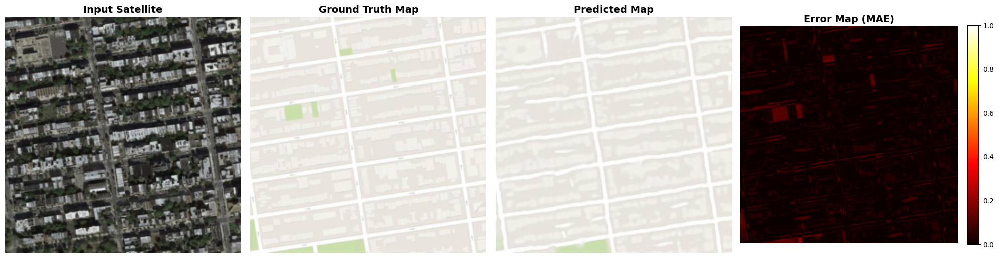

MAE for this sample: 0.015688
------------------------------------------------------------

Sample 2/10 (Index: 31)
------------------------------------------------------------


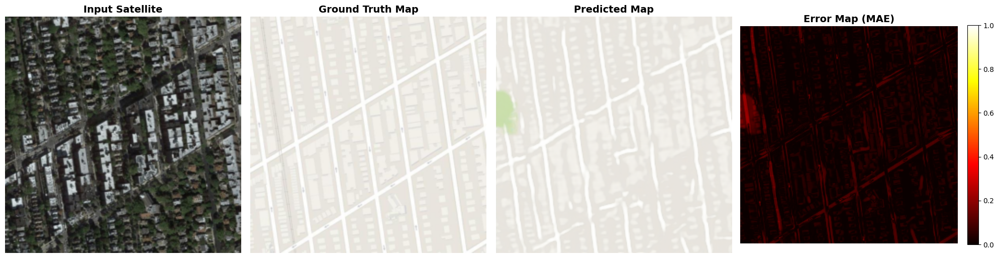

MAE for this sample: 0.020846
------------------------------------------------------------

Sample 3/10 (Index: 438)
------------------------------------------------------------


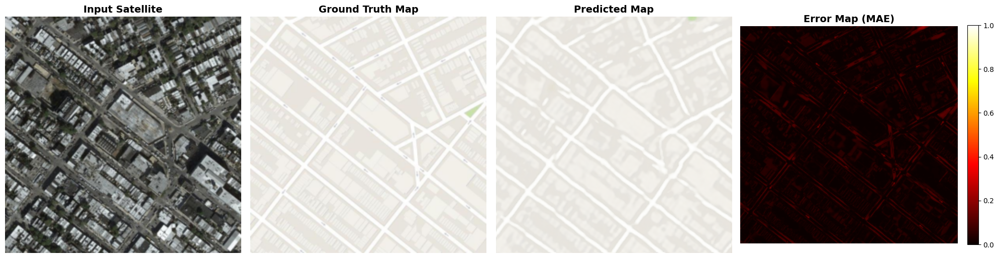

MAE for this sample: 0.017314
------------------------------------------------------------

Sample 4/10 (Index: 624)
------------------------------------------------------------


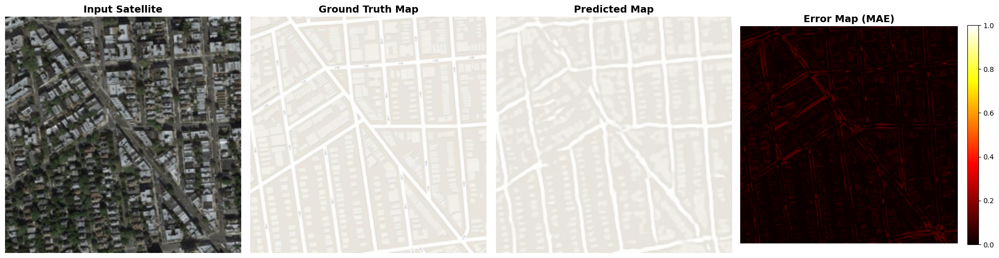

MAE for this sample: 0.016900
------------------------------------------------------------

Sample 5/10 (Index: 969)
------------------------------------------------------------


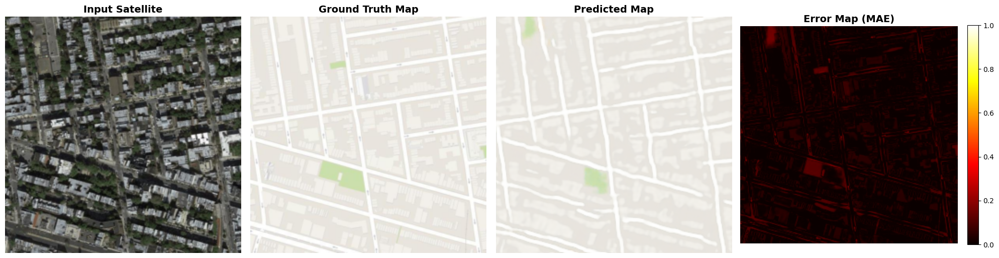

MAE for this sample: 0.018665
------------------------------------------------------------

Sample 6/10 (Index: 86)
------------------------------------------------------------


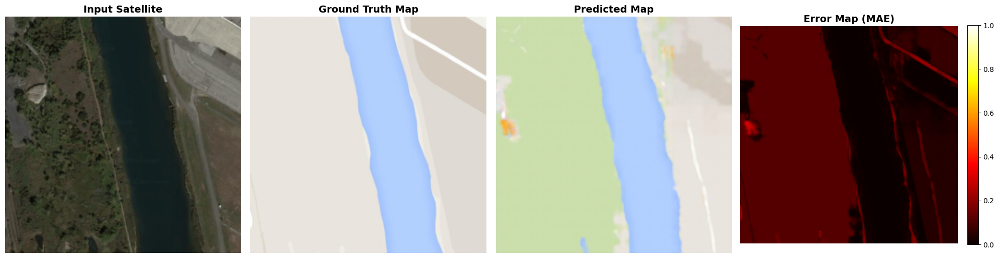

MAE for this sample: 0.065561
------------------------------------------------------------

Sample 7/10 (Index: 523)
------------------------------------------------------------


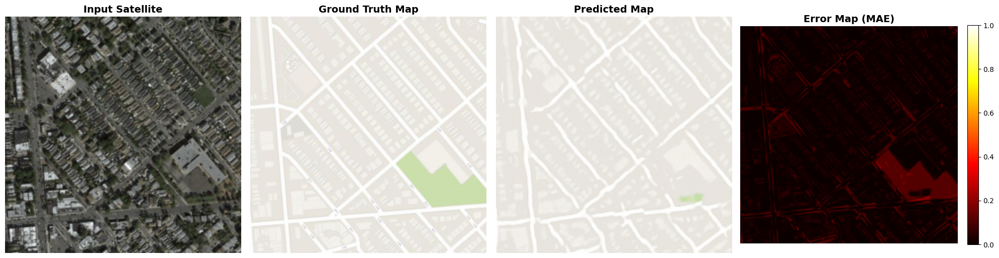

MAE for this sample: 0.019793
------------------------------------------------------------

Sample 8/10 (Index: 71)
------------------------------------------------------------


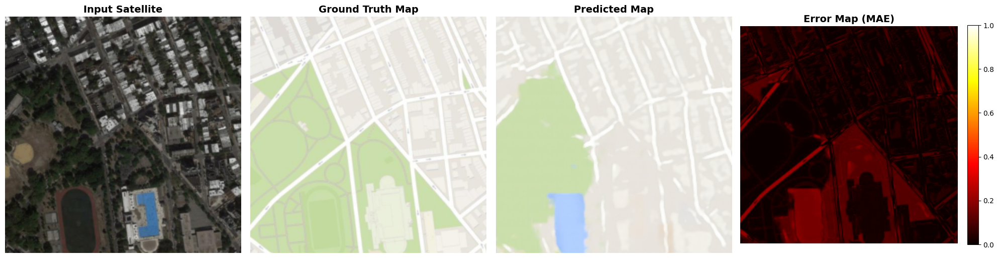

MAE for this sample: 0.040796
------------------------------------------------------------

Sample 9/10 (Index: 626)
------------------------------------------------------------


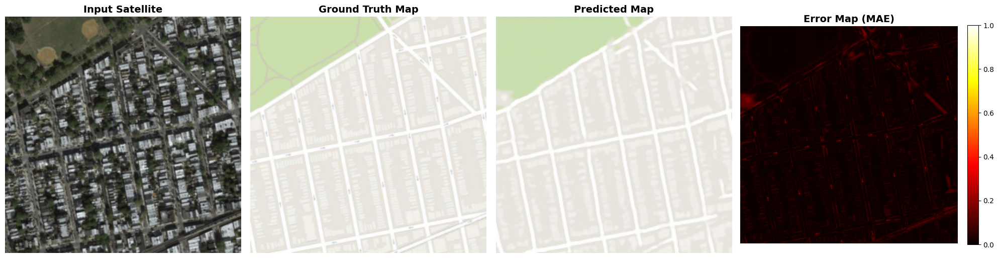

MAE for this sample: 0.014203
------------------------------------------------------------

Sample 10/10 (Index: 868)
------------------------------------------------------------


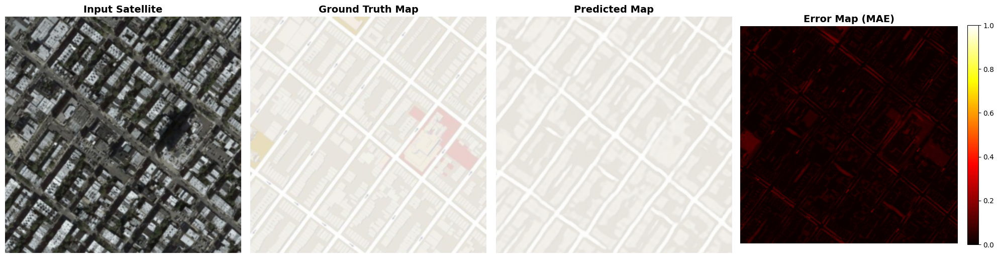

MAE for this sample: 0.018382
------------------------------------------------------------

SAMPLE GENERATION COMPLETED

To generate samples, run:
generate_samples(model, val_loader, Config, num_samples=10)

Or with specific checkpoint:
generate_samples(model, val_loader, Config, num_samples=10, checkpoint_path='path/to/checkpoint.pth')


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
import os

def generate_samples(model, val_loader, config, num_samples=40, checkpoint_path=None, seed=25):
    print("="*60)
    print("SAMPLE GENERATION")
    print("="*60)

    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if checkpoint_path is None:
        checkpoint_files = [f for f in os.listdir(config.CHECKPOINT_DIR) if f.endswith('.pth')]
        if checkpoint_files:
            checkpoint_files.sort(key=lambda x: int(x.split('_')[2].split('.')[0]) if 'epoch' in x else 0)
            checkpoint_path = os.path.join(config.CHECKPOINT_DIR, checkpoint_files[-1])

    if checkpoint_path and os.path.exists(checkpoint_path):
        print(f"Loading checkpoint: {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path, map_location=config.DEVICE)
        model.load_state_dict(checkpoint['model_state_dict'])
        epoch = checkpoint['epoch']
        print(f"Loaded model from epoch {epoch}")
    else:
        print("No checkpoint found. Using current model weights.")

    print("="*60)

    # Set model to evaluation mode
    model.eval()
    model = model.to(config.DEVICE)

    # Collect all validation samples
    print(f"\nCollecting validation samples...")
    all_samples = []

    with torch.no_grad():
        for satellite, target_map in val_loader:
            for i in range(satellite.shape[0]):
                all_samples.append((satellite[i], target_map[i]))

    print(f"Total validation samples: {len(all_samples)}")

    if num_samples > len(all_samples):
        num_samples = len(all_samples)
        print(f"Requested {num_samples} samples but only {len(all_samples)} available")

    selected_indices = random.sample(range(len(all_samples)), num_samples)
    print(f"Randomly selected {num_samples} samples")

    print("\n" + "="*60)
    print("GENERATING PREDICTIONS")
    print("="*60)

    for idx, sample_idx in enumerate(selected_indices):
        satellite, target_map = all_samples[sample_idx]

        satellite_batch = satellite.unsqueeze(0).to(config.DEVICE)
        target_map_batch = target_map.unsqueeze(0).to(config.DEVICE)

        with torch.no_grad():
            outputs = model(satellite_batch)
            predicted_map = outputs[0]

        satellite = satellite.cpu()
        target_map = target_map.cpu()
        predicted_map = predicted_map.squeeze(0).cpu()

        satellite = (satellite + 1) / 2
        target_map = (target_map + 1) / 2
        predicted_map = (predicted_map + 1) / 2

        satellite = torch.clamp(satellite, 0, 1)
        target_map = torch.clamp(target_map, 0, 1)
        predicted_map = torch.clamp(predicted_map, 0, 1)

        satellite_np = satellite.permute(1, 2, 0).numpy()
        target_map_np = target_map.permute(1, 2, 0).numpy()
        predicted_map_np = predicted_map.permute(1, 2, 0).numpy()

        error_map = np.abs(target_map_np - predicted_map_np)
        error_map = np.mean(error_map, axis=2)  # Average across channels

        print(f"\nSample {idx + 1}/{num_samples} (Index: {sample_idx})")
        print("-" * 60)

        fig, axes = plt.subplots(1, 4, figsize=(20, 5))

        # Input Satellite Image
        axes[0].imshow(satellite_np)
        axes[0].set_title('Input Satellite', fontsize=14, fontweight='bold')
        axes[0].axis('off')

        # Ground Truth Map
        axes[1].imshow(target_map_np)
        axes[1].set_title('Ground Truth Map', fontsize=14, fontweight='bold')
        axes[1].axis('off')

        # Predicted Map
        axes[2].imshow(predicted_map_np)
        axes[2].set_title('Predicted Map', fontsize=14, fontweight='bold')
        axes[2].axis('off')

        # Error Map
        im = axes[3].imshow(error_map, cmap='hot', vmin=0, vmax=1)
        axes[3].set_title('Error Map (MAE)', fontsize=14, fontweight='bold')
        axes[3].axis('off')
        plt.colorbar(im, ax=axes[3], fraction=0.046, pad=0.04)

        plt.tight_layout()
        plt.show()

        mae = np.mean(error_map)
        print(f"MAE for this sample: {mae:.6f}")
        print("-" * 60)

    print("\n" + "="*60)
    print("SAMPLE GENERATION COMPLETED")
    print("="*60)


# checkpoint_path = '/content/drive/MyDrive/swin_unet_checkpoints/checkpoint_epoch_600.pth'
# generate_samples(model, val_loader, Config, num_samples=10, checkpoint_path=checkpoint_path)

best_model_path = '/content/drive/MyDrive/swin_unet_checkpoints/best_model.pth'
generate_samples(model, val_loader, Config, num_samples=10, checkpoint_path=best_model_path)


print("\nTo generate samples, run:")
print("generate_samples(model, val_loader, Config, num_samples=10)")
print("\nOr with specific checkpoint:")
print("generate_samples(model, val_loader, Config, num_samples=10, checkpoint_path='path/to/checkpoint.pth')")